In [56]:
#!conda install --yes numpy matplotlib
#!python3 -m pip install 'tensorflow[and-cuda]' 'sionna'
#!conda install --yes pythreejs

In [89]:
import numpy as np
import tensorflow as tf

from sionna.rt import load_scene, Transmitter, Receiver, PlanarArray, Paths, PathSolver

#%matplotlib widget
import matplotlib.pyplot as plt

In [58]:
# load mitsuba scene
scene = load_scene("test-scene.xml")

In [59]:
# print found first 10 object materials
for i, obj in enumerate(scene.objects.values()):
    print(f"{obj.name} : {obj.radio_material.name}")
    if i >= 10:
        break

Plane : itu_concrete
no-name-7 : itu_metal
no-name-8 : itu_marble


In [60]:
# TX & RX antenna definition
scene.tx_array = PlanarArray(num_rows=4,
                              num_cols=4,
                              vertical_spacing=0.5,
                              horizontal_spacing=0.5,
                              pattern="tr38901",
                              polarization= "V")

scene.rx_array = PlanarArray(num_rows=1,
                              num_cols=1,
                              vertical_spacing=0.5,
                              horizontal_spacing=0.5,
                              pattern="iso",
                              polarization= "V")

# Transmitter/Receiver(antenna name, antenna location, antenna orientation)
tx = Transmitter("tx", [-61,-36,25], [0.0, 0.0, 0.0])
scene.add(tx)

rx = Receiver("rx", [-54,6,1.5], [0.0,0.0,0.0])
scene.add(rx)

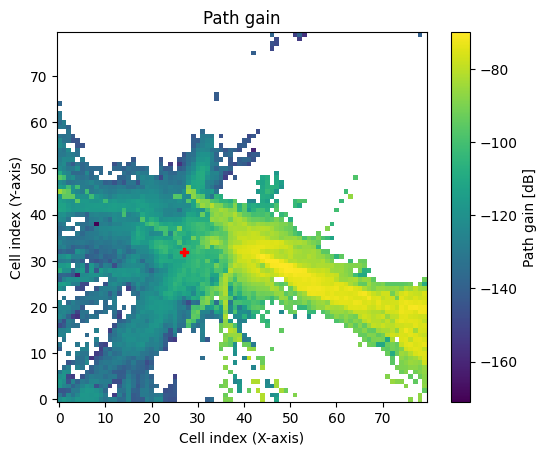

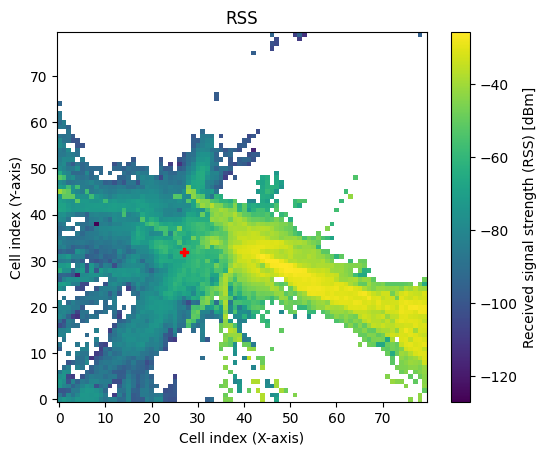

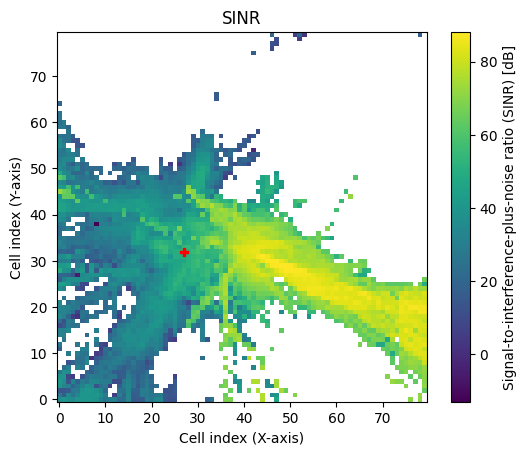

In [44]:
# Generate coverage map
#cm = scene.coverage_map() -> not available on sionna-rt 
#scene.preview()

from sionna.rt import RadioMapSolver, Camera

rm_solver = RadioMapSolver()
rm = rm_solver(scene,
               max_depth=5,           # Maximum number of ray scene interactions
               samples_per_tx=10**7 , # If you increase: less noise, but more memory required
               cell_size=(5, 5),      # Resolution of the radio map
               center=[0, 0, 0],      # Center of the radio map
               size=[400, 400],       # Total size of the radio map
               orientation=[0, 0, 0]) # Orientation of the radio map, e.g., could be also vertical

# Visualize path gain
rm.show(metric="path_gain");

# Visualize received signal strength (RSS)
rm.show(metric="rss");

# Visulaize SINR
rm.show(metric="sinr");

no_preview = True # Toggle to False to use the preview widget
                  # instead of rendering for scene visualization

In [61]:
rm_test = rm_solver(scene,
                      max_depth=5,
                      samples_per_tx=10**7,
                      cell_size=(1, 1))

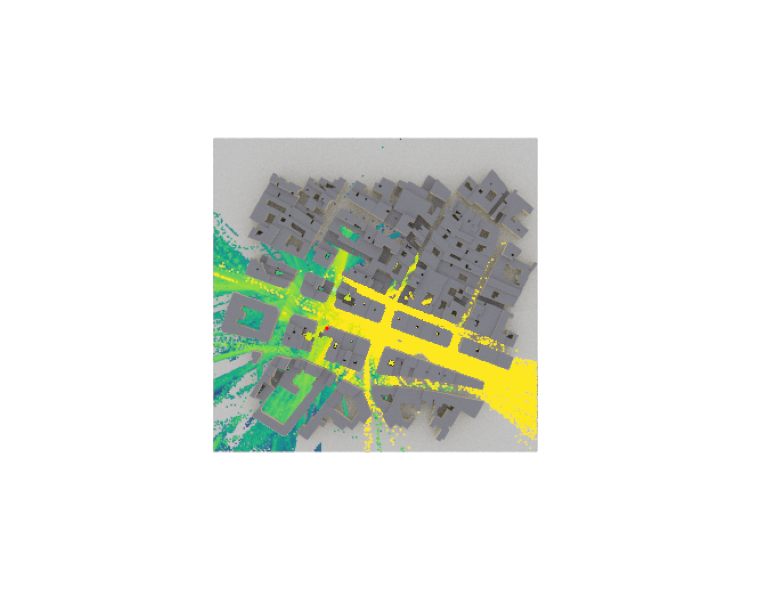

In [62]:
if no_preview:
    # Render an image
    cam = Camera(position=[0,0,1000],
                     orientation=np.array([0,np.pi/2,-np.pi/2]))
    scene.render(camera=cam,
                        radio_map=rm_test,
                        rm_metric="sinr",
                        rm_vmin=-10,
                        rm_vmax=60);
else:
    # Show preview
    scene.preview(radio_map=rm_test,
                         rm_metric="sinr",
                         rm_vmin=-10,
                         rm_vmax=60)

In [80]:
scene.preview(radio_map=rm_test,
                         rm_metric="sinr",
                         rm_vmin=-10,
                         rm_vmax=60,
                         rm_db_scale=True)

Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, matrixWorldNeedsUpda…

In [73]:
#scene.preview(coverage_map=cm) # not available in the newest version

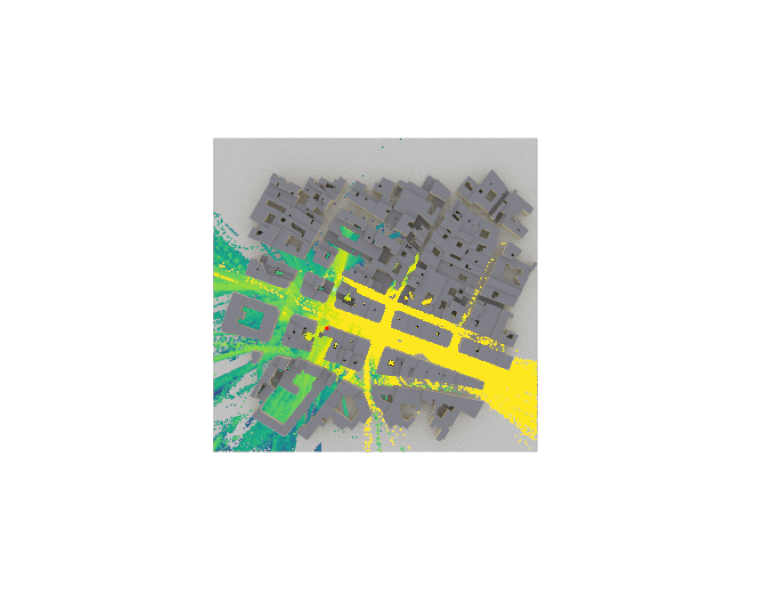

In [82]:
#scene.render("preview", coverage_map=cm) 
# new update
cam = Camera(position=[0,0,1000],
                 orientation=np.array([0,np.pi/2,-np.pi/2]))
scene.render(camera=cam,
                    radio_map=rm_test,
                    rm_metric="sinr",
                    rm_vmin=-10,
                    rm_vmax=60,rm_db_scale=True);

In [84]:
#paths = scene.compute_paths()
paths = scene.paths_solver

AttributeError: 'Scene' object has no attribute '_paths_solver'

In [86]:
p2c = Paths2CIR(sampling_frequency=100e6, scene=scene)
a, tau = p2c(paths.as_tuple())

TypeError: Paths.__init__() got an unexpected keyword argument 'sampling_frequency'

In [ ]:
plt.figure()
plt.stem(tau[0,0,0:]*1e9, np.abs(a[0,0,0,0,0,:,0]))
plt.xlabel("Delay [ns]")
plt.ylabel(r"$|a|$")

In [ ]:
scene.preview(paths=paths)
# check how to calculate path

In [87]:
scene.render("preview", paths=paths, coverage_map=mp)

NameError: name 'paths' is not defined

In [90]:
# TX points towards RX
tx.look_at(rx)

# Compute paths
solver = PathSolver()
paths = solver(scene)

# Open preview showing paths
scene.preview(paths=paths, resolution=[1000,600], clip_at=15.)

Renderer(camera=PerspectiveCamera(aspect=1.6666666666666667, children=(DirectionalLight(intensity=0.25, positi…

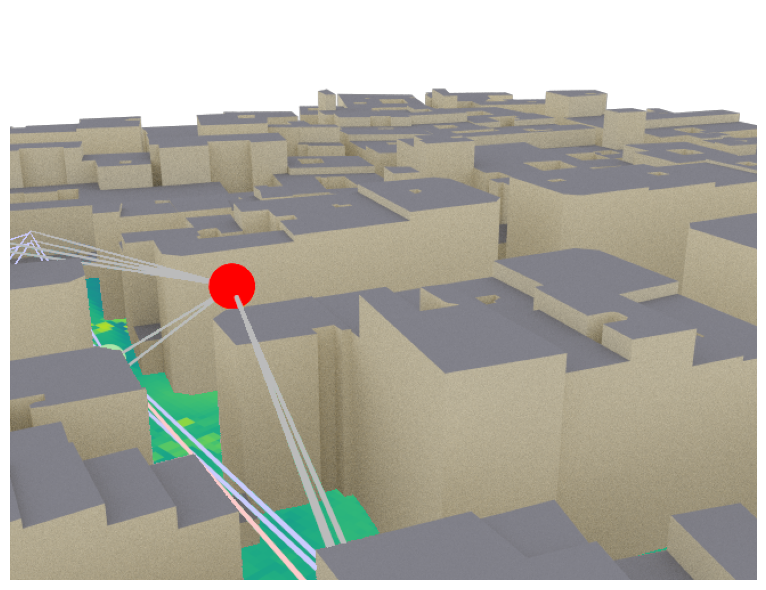

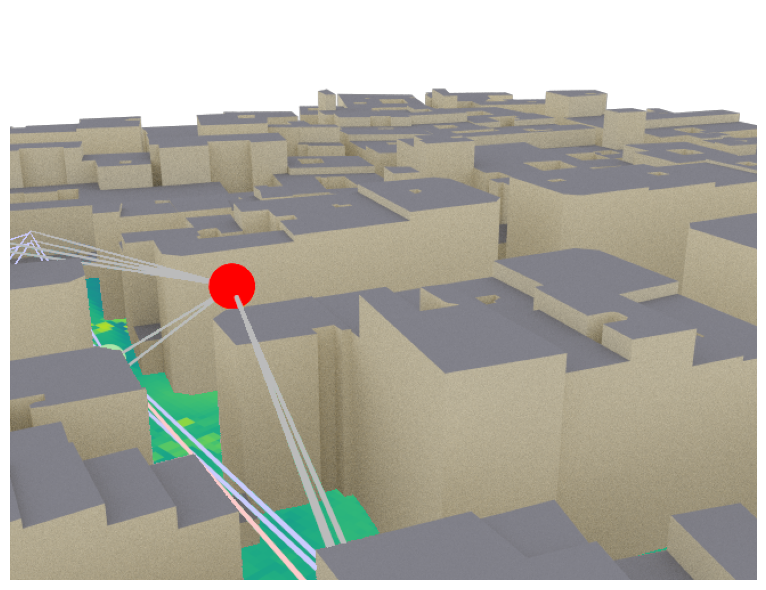

In [93]:
scene.render(camera="preview", radio_map=rm_test, paths=paths)